<a href="https://colab.research.google.com/github/josephsintum/plant_ml_colab/blob/main/ml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
!bash icevision_install.sh cuda11 master

import IPython
IPython.Application.instance().kernel.do_shutdown(True)
import icevision
from icevision.all import *

--2022-02-08 15:58:48--  https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2691 (2.6K) [text/plain]
Saving to: ‘icevision_install.sh’

icevision_install.s 100%[===================>]   2.63K  --.-KB/s    in 0s      

2022-02-08 15:58:48 (44.5 MB/s) - ‘icevision_install.sh’ saved [2691/2691]

Installing icevision + dependencices for cuda11
- Installing torch and its dependencies
Looking in links: https://download.pytorch.org/whl/torch_stable.html
- Installing mmcv
     |████████████████████████████████| 51.3 MB 4.3 MB/s 
     |████████████████████████████████| 190 kB 14.2 MB/s 
- Installing mmdet
     |████████████████████████████████| 1.2 MB 20.2 MB/s 
- Installing icevision from ma

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

# New Section

In [1]:
!git clone https://github.com/josephsintum/PlantDoc-Object-Detection-Dataset.git

Cloning into 'PlantDoc-Object-Detection-Dataset'...
remote: Enumerating objects: 5196, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 5196 (delta 2), reused 6 (delta 2), pack-reused 5190
Receiving objects: 100% (5196/5196), 941.95 MiB | 35.30 MiB/s, done.
Resolving deltas: 100% (2330/2330), done.
Checking out files: 100% (5199/5199), done.


In [2]:
!pwd  # output: '/content'
!ls  # output: PlantDoc-Object-Detection-Dataset

/content
icevision_install.sh  PlantDoc-Object-Detection-Dataset  sample_data


In [3]:
%cd PlantDoc-Object-Detection-Dataset/
!ls

/content/PlantDoc-Object-Detection-Dataset
LICENSE.txt  TEST  test_labels.csv  TRAIN  train_labels.csv


In [4]:
from icevision.all import *

data_dir = Path('.')
print(data_dir)

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'


INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:18


.


In [5]:
import pandas as pd

annot = pd.read_csv('train_labels.csv')
annot.rename(columns={'class': 'label'}, inplace=True)
annot.sample(3)

,filename,width,height,label,xmin,ymin,xmax,ymax
244,wild-strawberry-fragaria-vesca-leaves-with-a-single-flower-KD619N.jpg,1286,1390,Strawberry leaf,966,394,1161,557
46,green-strawberry-leaf-isolated-white-single-background-78801845.jpg,1300,1206,Strawberry leaf,722,489,1261,1087
688,1688.jpg,1024,768,Tomato leaf,695,422,826,587


In [6]:
annot.filename.nunique()

196

In [7]:
_CLASSES = annot['label'].unique().tolist()
len(_CLASSES)

class_map = ClassMap(_CLASSES)

In [8]:
template_record = ObjectDetectionRecord()

class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)
        self.data_dir = data_dir
        self.df = annot
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'TRAIN' / o.filename
            # print(filepath)
            record.set_filepath(filepath)
            if filepath.exists():
                image_size = get_img_size(filepath)
                record.set_img_size(image_size)  #
            record.detection.set_class_map(self.class_map)
        record.detection.add_bboxes(
            [BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

  0%|          | 0/770 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/196 [00:00<?, ?it/s]

BaseRecord

common: 
	- Image size ImgSize(width=382, height=261)
	- Record ID: 1576389-early%20blight%20symptoms.jpg
	- Filepath: TRAIN/1576389-early%20blight%20symptoms.jpg
	- Img: None
detection: 
	- BBoxes: [<BBox (xmin:44, ymin:29, xmax:382, ymax:246)>]
	- Class Map: <ClassMap: {'background': 0, 'Strawberry leaf': 1, 'Tomato leaf late blight': 2, 'Tomato leaf bacterial spot': 3, 'Bell_pepper leaf spot': 4, 'Bell_pepper leaf': 5, 'Tomato two spotted spider mites leaf': 6, 'Tomato Early blight leaf': 7, 'Tomato mold leaf': 8, 'Tomato leaf': 9, 'Tomato Septoria leaf spot': 10, 'Tomato leaf yellow virus': 11}>
	- Labels: [7]

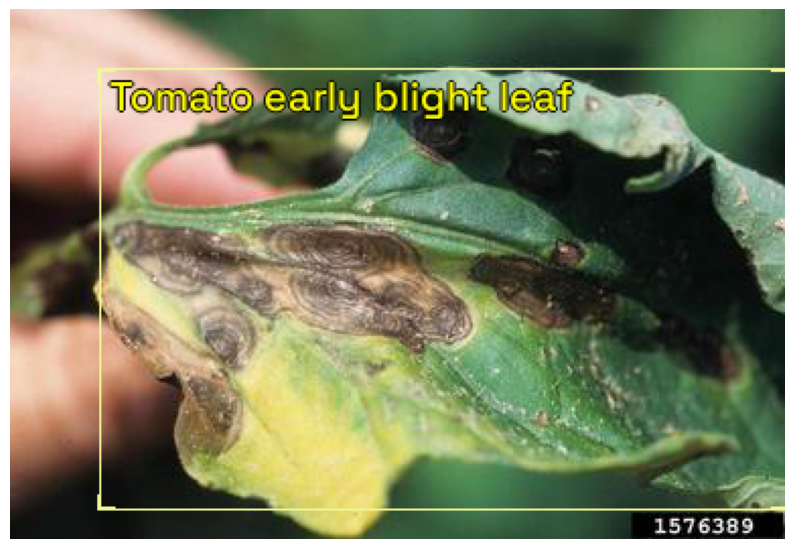

In [9]:
parser = PlantDocParser(template_record, data_dir)
train_records, valid_records = parser.parse()
show_record(train_records[0], class_map=class_map, 
            figsize = (10,10),font_size=20, label_color = '#ffff00')
train_records[0]

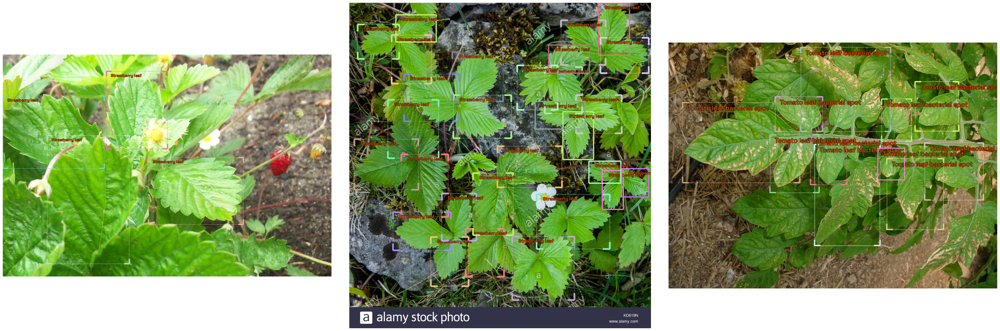

In [10]:
show_records(train_records[33:36], ncols=3,
             font_size=20, label_color='#ff5000')

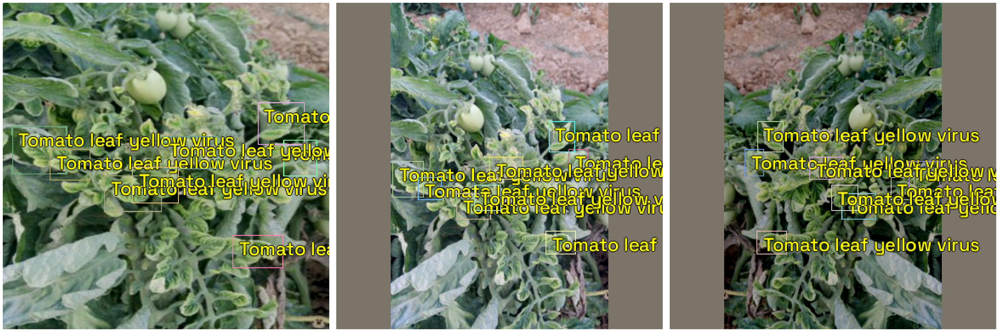

In [11]:
presize = 512
image_size = 384
train_tfms = tfms.A.Adapter(
    [*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter(
    [*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)
samples = [train_ds[38] for _ in range(3)]
show_samples(samples, ncols=3, font_size=22, label_color='#ffff00')

In [12]:
import matplotlib.pyplot as plt


def plot_metrics(learn, title, x, y):
    plt.plot(L(learn.recorder.values).itemgot())
    plt.xlabel('epoch')
    plt.ylabel('mAP (green), Loss (blue, orange)')
    plt.title(title)
    plt.text(x, y,
             'Legend: mAP(green), train_loss(blue), valid_loss(orange')

In [ ]:
model_type = models.ultralytics.yolov5 
backbone = model_type.backbones.small
model = model_type.model(backbone = backbone(pretrained=True), 
            num_classes=len(parser.class_map),img_size = image_size)
train_dl = model_type.train_dl(
            train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(
            valid_ds, batch_size=16, num_workers=4, shuffle=False)
                                       
learn = model_type.fastai.learner(
            dls=[train_dl, valid_dl], model=model, metrics=metrics)
# learn.lr_find()
learn.fine_tune(30, 3e-3 , freeze_epochs=1) 
plot_metrics(learn, 
       'Mean Average Precision and Losses for YOLOv5', 0,-0.23)

  0%|          | 0.00/14.0M [00:00<?, ?B/s]

02/08/2022 18:29:51 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=11
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
02/08/2022 18:29:51 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3  

epoch,train_loss,valid_loss,COCOMetric,time
0,1.379063,1.209423,0.095801,01:41


epoch,train_loss,valid_loss,COCOMetric,time
0,1.156983,1.091760,0.004336,01:42
1,1.102033,1.026234,0.021778,01:43
2,1.066206,0.992981,0.026530,01:39
3,1.029344,0.966429,0.031175,01:40
4,1.004907,0.927252,0.052245,01:45
5,0.971577,0.911071,0.042553,01:42


epoch,train_loss,valid_loss,COCOMetric,time
0,1.156983,1.091760,0.004336,01:42
1,1.102033,1.026234,0.021778,01:43
2,1.066206,0.992981,0.026530,01:39
3,1.029344,0.966429,0.031175,01:40
4,1.004907,0.927252,0.052245,01:45
5,0.971577,0.911071,0.042553,01:42
6,0.938918,0.870932,0.065681,01:39
7,0.909773,0.898772,0.054589,01:40
8,0.878468,0.824061,0.050112,01:39
9,0.847982,0.786772,0.086051,01:38


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')
fname_model = 'plantdoc-yolov5.pth'
# create a 'models' folder in GDrive prior to running the following line:
torch.save(model.state_dict(), root_dir/'models'/fname_model) 